This notebook implements the full working process to deal with different chains and compare the results.

In [1]:
import os, sys
import numpy as np
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
import matplotlib
import matplotlib.pyplot as plt
import yaml

# Define chain folder
chain_dir = os.path.join(os.getcwd(), 'chains/perlmutter/')

# Whether to plot prior and posterior distributions
plotting = False 

from getdist import loadMCSamples, plots, mcsamples, MCSamples
from python_scripts.prior import * 
from python_scripts.utils import *

2023-12-12 11:47:35.830953: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-12-12 11:47:35.960609: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-12 11:47:35.960659: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-12 11:47:35.960708: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-12 11:47:36.054992: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-12-12 11:47:36.056930: I tensorflow/core/platform/cpu_feature_guard.cc:182] This Tens

### 1. EFT BOSS: $p_k$ with $4$ sky-cuts, WC prior, BBN prior

#### Prior Sampling using the `full_prior` function
Details on the arguments of the `full_prior` function:  
- `root_dir`: full path to the directory containing the `log.param` file and the chains,
- `chain_name`: prefix used to name the chain files,
- `config_name`: simply the name of the `.yaml` file. 

In order to get the nuisance parameter's prior, remember to copy the `.yaml` configuration file given by PyBird inside the chain folder! Here you have to set the argument:
- `config_name`: the name (excluding the extension) of the configuration file, e.g. */boss_pk_wc*.

In [45]:
posterior = loadMCSamples(file_root=chain_dir+'/eftboss_wc_std/2023-12-04_10000_', settings={'ignore_rows':0.3})
posterior.name_tag = 'BOSS + BBN'

param_limits, prior = full_prior(root_dir=chain_dir+'eftboss_wc_std/', chain_name='2023-12-04_10000_', 
                                                config_name='eftboss_wc_std', name_tag='BOSS + BBN Prior')

List of "cosmological" parameters: ['omega_b', 'omega_cdm', 'h', 'ln10^{10}A_s', 'n_s']
List of "derived"      parameters: ['Omega_m', 'A_s', 'sigma8']
List of "nuisance"     parameters: ['b1_hN', 'c2_hN', 'b1_hS', 'c2_hS', 'b1_lN', 'c2_lN', 'b1_lS', 'c2_lS']

Fixed Parameter Limits:
omega_cdm    | (0.08, 0.16)  
h            | (0.635, 0.715)
ln10^{10}A_s | (2.644, 3.444)
n_s          | (0.765, 1.165)
b1_hN        | (0.0, 4.0)    
c2_hN        | (-10.0, 10.0) 
b1_hS        | (0.0, 4.0)    
c2_hS        | (-10.0, 10.0) 
b1_lN        | (0.0, 4.0)    
c2_lN        | (-10.0, 10.0) 
b1_lS        | (0.0, 4.0)    
c2_lS        | (-10.0, 10.0) 



In [3]:
cosmo_names = prior.getParamNames().list()[:8]
nuisance_names = prior.getParamNames().list()[8:]
if plotting:
    # Plotting cosmological parameters
    g = plots.get_subplot_plotter(width_inch=9)
    g.settings.alpha_filled_add = 0.3
    g.settings.title_limit_fontsize = 0.8
    g.triangle_plot([posterior, prior], cosmo_names, title_limit=1,
                    filled=True,
                    param_limits=param_limits);

In [4]:
if plotting:
    # Plotting nuisance parameters
    g = plots.get_subplot_plotter(width_inch=10)
    g.settings.alpha_filled_add = 0.3
    g.settings.title_limit_fontsize = 0.8
    g.triangle_plot([posterior, prior], nuisance_names, title_limit=1,
                    filled=True,
                    param_limits=param_limits);

Non-log N_eff 	= 12.503



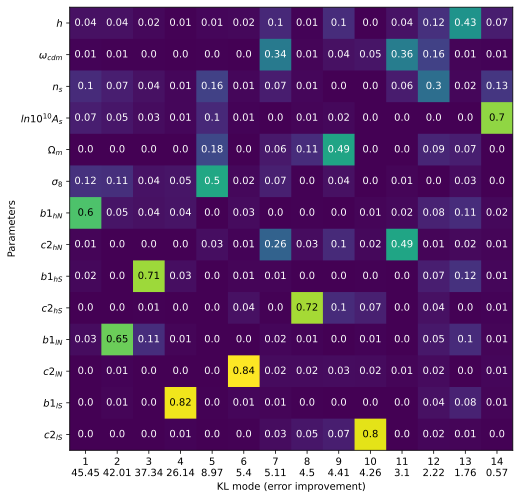

In [5]:
# Re-definition of params
params = ['h', 'omega_cdm', 'n_s', 'ln10^{10}A_s', 'Omega_m', 'sigma8', 
                'b1_hN', 'c2_hN', 'b1_hS', 'c2_hS', 'b1_lN', 'c2_lN', 'b1_lS', 'c2_lS']
labels = ['h', '\omega_{cdm}', 'n_s', '\ln{10^{10}A_s}', '\Omega_m', '\sigma_8',
                'b1_{hN}', 'c2_{hN}', 'b1_{hS}', 'c2_{hS}', 'b1_{lN}', 'c2_{lN}', 'b1_{lS}', 'c2_{lS}']

KL_eig, KL_eigv, KL_param_names = plot_frac_fisher(prior_chain=prior, posterior_chain=posterior, 
                                                   params=params, labels=labels, norm=True)

**Prior Shrinking**

In [6]:
idx = [posterior.index[name] for name in KL_param_names]
prior_mean = prior.getMeans(pars=[prior.index[name] for name in KL_param_names])
posterior_mean = posterior.getMeans(pars=[posterior.index[name] for name in KL_param_names])
inv_KL_eigv = np.linalg.inv(KL_eigv)
# Only keeping the first 12 modes
inv_KL_eigv[12:,:] = 0.
# Project the shifted posterior samples on the KL modes
KL_filtered_samples = np.dot(np.dot(posterior.samples[:,idx]-prior_mean, KL_eigv), inv_KL_eigv)+prior_mean

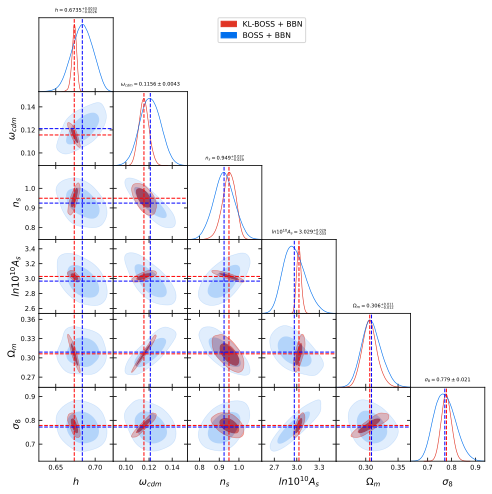

In [7]:
# Prior Shrinking - Cosmological Parameters
KL_chain = MCSamples(samples=KL_filtered_samples, 
                     loglikes=posterior.loglikes, 
                     weights=posterior.weights, 
                     names=params, 
                     labels=[name.label for name in posterior.getParamNames().parsWithNames(params)], 
                     label='KL-BOSS + BBN',
                     settings={'ignore_rows':0.})
g = plots.get_subplot_plotter(width_inch=8)
g.settings.alpha_filled_add = 0.3
g.settings.title_limit_fontsize = 0.8
# The titles refer to the mean values of the KL posterior distributions
# Cosmological Parameters
temp_params = params[:6]
g.triangle_plot([KL_chain, posterior], params=temp_params, filled=True, title_limit=1)
KL_means = KL_chain.getMeans(pars=[KL_chain.index[name] for name in temp_params])
means = posterior.getMeans(pars=[posterior.index[name] for name in temp_params])
# Display mean indicators
for i in range(len(temp_params)):
    # Fix the column, change the row -> decreasing from len(cosmo_params)
    for ax in g.subplots[i:,i]:
        ax.axvline(KL_means[i], color='red', lw=1., ls='--')
        ax.axvline(means[i], color='blue', lw=1., ls='--')
    # Fix the row, change the column -> increasing from 0
    for ax in g.subplots[i,:i]:
        ax.axhline(KL_means[i], color='red', lw=1., ls='--')
        ax.axhline(means[i], color='blue', lw=1., ls='--')

In [8]:
# Prior Shrinking - EFT Parameters
g = plots.get_subplot_plotter(width_inch=10)
g.settings.alpha_filled_add = 0.3
g.settings.title_limit_fontsize = 0.8
# The titles refer to the mean values of the KL posterior distributions
temp_params = params[6:]
g.triangle_plot([KL_chain, posterior], params=temp_params, filled=True, title_limit=1)
KL_means = KL_chain.getMeans(pars=[KL_chain.index[name] for name in temp_params])
means = posterior.getMeans(pars=[posterior.index[name] for name in temp_params])
# Display mean indicators
for i in range(len(temp_params)):
    # Fix the column, change the row -> decreasing from len(cosmo_params)
    for ax in g.subplots[i:,i]:
        ax.axvline(KL_means[i], color='red', lw=1., ls='--')
        ax.axvline(means[i], color='blue', lw=1., ls='--')
    # Fix the row, change the column -> increasing from 0
    for ax in g.subplots[i,:i]:
        ax.axhline(KL_means[i], color='red', lw=1., ls='--')
        ax.axhline(means[i], color='blue', lw=1., ls='--')

Looking at the Fractional Fisher Matrix above, now we realize that the $c2$ parameters are actually dominating on some modes and therefore the posterior is well-preserved after the prior shrinking. The only exception can be noticed on the 1D posterior distribution of $c2_{hN}$: from the matrix we can not conclude that it is being strongly informed by any of the 12 main modes. However, the last plot suggests that the posterior is almost not informed at all by the prior distribution: this effect could be a consequence of the clear non-gaussianities of this parameter's posterior.

### 2. EFT BOSS: $p_k$ with $4$ sky-cuts, WC prior, NO BBN prior
We now repeat the same procedure using the chains computed without the BBN prior on $\omega_b$.

In [9]:
nobbn_posterior = loadMCSamples(file_root=chain_dir+'/eftboss_wc_nobbn/2023-12-05_10000_', settings={'ignore_rows':0.3})
nobbn_posterior.name_tag = 'BOSS'

In [10]:
nobbn_param_limits, nobbn_prior = full_prior(root_dir=chain_dir+'eftboss_wc_nobbn/', chain_name='2023-12-05_10000_', 
                                                config_name='eftboss_wc_std', name_tag='BOSS Prior')

List of "cosmological" parameters: ['omega_b', 'omega_cdm', 'h', 'ln10^{10}A_s', 'n_s']
List of "derived"      parameters: ['Omega_m', 'A_s', 'sigma8']
List of "nuisance"     parameters: ['b1_hN', 'c2_hN', 'b1_hS', 'c2_hS', 'b1_lN', 'c2_lN', 'b1_lS', 'c2_lS']

Fixed Parameter Limits:
omega_b      | (2.068, 2.468)
omega_cdm    | (0.08, 0.16)  
h            | (0.635, 0.715)
ln10^{10}A_s | (2.644, 3.444)
n_s          | (0.765, 1.165)
b1_hN        | (0.0, 4.0)    
c2_hN        | (-10.0, 10.0) 
b1_hS        | (0.0, 4.0)    
c2_hS        | (-10.0, 10.0) 
b1_lN        | (0.0, 4.0)    
c2_lN        | (-10.0, 10.0) 
b1_lS        | (0.0, 4.0)    
c2_lS        | (-10.0, 10.0) 



In [11]:
if plotting:
    # Plotting cosmological parameters
    g = plots.get_subplot_plotter(width_inch=9)
    g.settings.alpha_filled_add = 0.3
    g.settings.title_limit_fontsize = 0.8
    g.triangle_plot([nobbn_posterior, nobbn_prior], cosmo_names, title_limit=1,
                    filled=True,
                    param_limits=nobbn_param_limits);

In [12]:
if plotting:
    # Plotting nuisance parameters
    g = plots.get_subplot_plotter(width_inch=10)
    g.settings.alpha_filled_add = 0.3
    g.settings.title_limit_fontsize = 0.8
    g.triangle_plot([nobbn_posterior, nobbn_prior], nuisance_names, title_limit=1,
                    filled=True,
                    param_limits=param_limits);

Non-log N_eff 	= 11.963



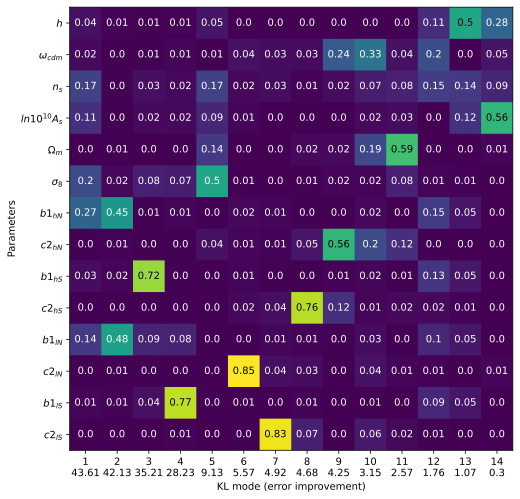

In [13]:
# Fisher Matrix
nobbn_KL_eig, nobbn_KL_eigv, nobbn_KL_param_names = plot_frac_fisher(prior_chain=nobbn_prior, posterior_chain=nobbn_posterior, 
                                                   params=params, labels=labels, norm=True)

**Prior Shrinking**

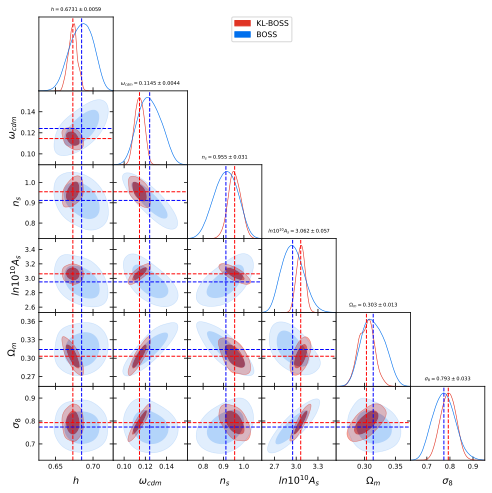

In [14]:
idx = [nobbn_posterior.index[name] for name in nobbn_KL_param_names]
nobbn_prior_mean = nobbn_prior.getMeans(pars=[nobbn_prior.index[name] for name in nobbn_KL_param_names])
nobbn_posterior_mean = nobbn_posterior.getMeans(pars=[nobbn_posterior.index[name] for name in nobbn_KL_param_names])
nobbn_inv_KL_eigv = np.linalg.inv(nobbn_KL_eigv)
# Only keeping the first 12 modes
nobbn_inv_KL_eigv[12:,:] = 0.
# Project the shifted posterior samples on the KL modes
nobbn_KL_filtered_samples = np.dot(np.dot(nobbn_posterior.samples[:,idx]-nobbn_prior_mean, nobbn_KL_eigv), 
                                   nobbn_inv_KL_eigv)+nobbn_prior_mean

# Prior Shrinking - Cosmological Parameters
nobbn_KL_chain = MCSamples(samples=nobbn_KL_filtered_samples, 
                     loglikes=nobbn_posterior.loglikes, 
                     weights=nobbn_posterior.weights, 
                     names=params, 
                     labels=[name.label for name in nobbn_posterior.getParamNames().parsWithNames(params)], 
                     label='KL-BOSS',
                     settings={'ignore_rows':0.})
g = plots.get_subplot_plotter(width_inch=8)
g.settings.alpha_filled_add = 0.3
g.settings.title_limit_fontsize = 0.8
# The titles refer to the mean values of the KL posterior distributions
# Cosmological Parameters
temp_params = params[:6]
g.triangle_plot([nobbn_KL_chain, nobbn_posterior], params=temp_params, filled=True, title_limit=1)
nobbn_KL_means = nobbn_KL_chain.getMeans(pars=[nobbn_KL_chain.index[name] for name in temp_params])
nobbn_means = nobbn_posterior.getMeans(pars=[nobbn_posterior.index[name] for name in temp_params])
# Display mean indicators
for i in range(len(temp_params)):
    # Fix the column, change the row -> decreasing from len(cosmo_params)
    for ax in g.subplots[i:,i]:
        ax.axvline(nobbn_KL_means[i], color='red', lw=1., ls='--')
        ax.axvline(nobbn_means[i], color='blue', lw=1., ls='--')
    # Fix the row, change the column -> increasing from 0
    for ax in g.subplots[i,:i]:
        ax.axhline(nobbn_KL_means[i], color='red', lw=1., ls='--')
        ax.axhline(nobbn_means[i], color='blue', lw=1., ls='--')

In [15]:
# Prior Shrinking - EFT Parameters
g = plots.get_subplot_plotter(width_inch=10)
g.settings.alpha_filled_add = 0.3
g.settings.title_limit_fontsize = 0.8
# EFT Parameters
temp_params = params[6:]
g.triangle_plot([nobbn_KL_chain, nobbn_posterior], params=temp_params, filled=True, title_limit=1)
nobbn_KL_means = nobbn_KL_chain.getMeans(pars=[nobbn_KL_chain.index[name] for name in temp_params])
nobbn_means = nobbn_posterior.getMeans(pars=[nobbn_posterior.index[name] for name in temp_params])
# Display mean indicators
for i in range(len(temp_params)):
    # Fix the column, change the row -> decreasing from len(cosmo_params)
    for ax in g.subplots[i:,i]:
        ax.axvline(nobbn_KL_means[i], color='red', lw=1., ls='--')
        ax.axvline(nobbn_means[i], color='blue', lw=1., ls='--')
    # Fix the row, change the column -> increasing from 0
    for ax in g.subplots[i,:i]:
        ax.axhline(nobbn_KL_means[i], color='red', lw=1., ls='--')
        ax.axhline(nobbn_means[i], color='blue', lw=1., ls='--')

### 3. Comparison of results and best-constrained parameters
As you can see from the EFT parameters *KL-filtered* distributions, it is possible to identify a similar behaviour but with a major difference: on the one hand, the distributions from which the contribution of the prior has been removed are almost superimposable from the point of view of the $4$ skies-cut of $c2$; on the other hand, it is evident that removing the prior on $\Omega_b$ (*BBN prior*) has informed the $4$ components of $b1$ in a less significant manner, so that their filtered and non-filtered distributions look more similar.\
We can look for confirmation also in the parameters' fractional contribution to the CPC-mode variance: here a lower number represents a lower contribution of the parameter to the total variance of the associated best-constrained mode.\
As you can see, the $4$ $c2$ contributions are very large - $\gtrsim 80\%$ - and, as expected, also very similar in magnitude.\
The $4$ $b1$ contributions are quite large as well - $\gtrsim 50\%$ - but removing the BBN prior results in a lower prameter contribution to the mode's variance. 

This result is probably a consequence of the fact that, by removing a strong assumption on $\Omega_b$, the other cosmological parameters are freer to vary and thus contribute to the best-constrained modes. Therefore, the variations on the EFT parameters would seem to be more of a 'side-effect' of the variations on the cosmological parameters, which are now less constrained by the prior.

In [16]:
dict = gaussian_tension.linear_CPCA_chains(prior, posterior, param_names=params)
nobbn_dict = gaussian_tension.linear_CPCA_chains(nobbn_prior, nobbn_posterior, param_names=params)
# Short utility function to print the Maximum Variance Contribution for each parameter of a given list.
def print_max(dict1={}, dict2={}, pars=[]):
    print('Maximum Variance Contribution')
    for par in pars:
        idx = find_index(params, lambda p: p == par)[0]
        print(f"{par} : {max(dict1['CPCA_var_contributions'][idx][:]):.2}", end='\t|    ')
        print(f"{par} : {max(dict2['CPCA_var_contributions'][idx][:]):.2}")

print_max(dict, nobbn_dict, params[6:])

Maximum Variance Contribution
b1_hN : 0.6	|    b1_hN : 0.45
c2_hN : 0.49	|    c2_hN : 0.56
b1_hS : 0.71	|    b1_hS : 0.72
c2_hS : 0.72	|    c2_hS : 0.76
b1_lN : 0.65	|    b1_lN : 0.48
c2_lN : 0.84	|    c2_lN : 0.85
b1_lS : 0.82	|    b1_lS : 0.77
c2_lS : 0.8	|    c2_lS : 0.83


As far as the cosmological parameters are concerned, in fact, the differences are somewhat more pronounced, and it can be observed that the second case - the one without the BBN pior - has posterior distributions with a variance that is generally more consistent with the one obtained by removing the prior's contribution. This result is a natural consequence of removing an informative prior at the sampling level.\
On the other hand, we can observe how $\sigma_8$ and $\Omega_m$ present a good overlap between the filtered and unfiltered distributions in both cases, suggesting that these two parameters are relevant in the best-constrained set.\
We can also confirm these reflections quantitatively:

Maximum Variance Contribution
Omega_m : 0.49	|    Omega_m : 0.59
sigma8 : 0.5	|    sigma8 : 0.5


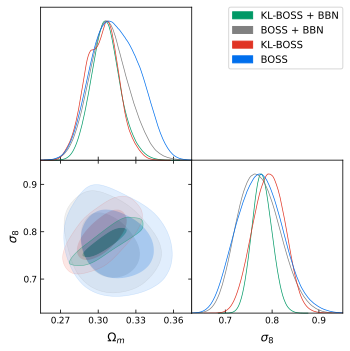

In [17]:
print_max(dict, nobbn_dict, ['Omega_m', 'sigma8'])

g = plots.get_subplot_plotter(width_inch=5)
g.settings.alpha_filled_add = 0.3
g.settings.title_limit_fontsize = 0.8
# EFT Parameters
temp_params = params[6:]
g.triangle_plot([KL_chain, posterior, nobbn_KL_chain, nobbn_posterior], params=['Omega_m', 'sigma8'], filled=True)

Furthermore, the 2D distribution in the $\Omega_m-\sigma_8$ plane suggests that there is a direction that, resulting from the combination of the two parameters, actually allows for the greatest amount of variance. We expect a relationship of the type:
$$
mode = \mathcal{f}(\sigma_8, \Omega_m)
$$
with $\Omega_m$ being the dominant direction.

In [39]:
# Print CPC parameter combinations
dict = gaussian_tension.linear_CPCA_chains(prior, posterior, param_names=params)
nobbn_dict = gaussian_tension.linear_CPCA_chains(nobbn_prior, nobbn_posterior, param_names=params)

# Define the start and end string delimiting the text to be printed
start = 'CPC parameter combinations:'
end = 'CPC modes parameters correlations'
s = gaussian_tension.print_CPCA_results(dict)
print('BOSS + BBN CPC Parameter Combinations', end=' ')
print(s[s.find(start)+len(start):s.rfind(end)])
s = gaussian_tension.print_CPCA_results(nobbn_dict)
print('\n\nBOSS CPC Parameter Combinations', end=' ')
print(s[s.find(start)+len(start):s.rfind(end)])

BOSS + BBN CPC Parameter Combinations 
   1 : 2066.121 (  4545.5 %)
      -1.05*(n_{s } -0.92) +1.09*(\sigma_8 -0.77) +1.00*(b1_{hN } -2.01) = 0 +- 0.027 (post) / 1.2 (prior)
   2 : 1764.990 (  4201.2 %)
      +1.22*(\sigma_8 -0.77) +1.00*(b1_{lN } -1.97) = 0 +- 0.029 (post) / 1.2 (prior)
   3 : 1394.630 (  3734.5 %)
      +1.00*(b1_{hS } -2.12) -0.26*(b1_{lN } -1.97) = 0 +- 0.033 (post) / 1.2 (prior)
   4 :  683.184 (  2613.8 %)
      +1.00*(b1_{lS } -1.94) = 0 +- 0.045 (post) / 1.2 (prior)
   5 :   80.408 (   896.7 %)
      +0.11*(n_{s } -0.92) +1.87*(\Omega{}_{m } -0.31) +1.00*(\sigma_8 -0.77) = 0 +- 0.011 (post) / 0.095 (prior)
   6 :   29.170 (   540.1 %)
      +1.00*(c2_{lN } -1.15) = 0 +- 0.4 (post) / 2.2 (prior)
   7 :   26.095 (   510.8 %)
      +1.00*(\omega{}_{cdm } -0.12) -0.00*(c2_{hN } -0.46) = 0 +- 0.00092 (post) / 0.0048 (prior)
   8 :   20.228 (   449.8 %)
      +159.38*(\Omega{}_{m } -0.31) +1.00*(c2_{hS } -1.21) = 0 +- 0.51 (post) / 2.3 (prior)
   9 :   19.446 (   44

As was to be expected, we observe the existence of a CPC mode strongly dependent on $\Omega_m$ and $\sigma_8$, as well as on $n_s$, which was, however, more difficult to detect graphically.\
This mode is defined as:
$$
mode \sim 0.1n_s + 1.5\Omega_m + \sigma_8
$$
Now, if we add this new parameter to the prior and posterior chains of both cases we expect it to be well-constrained by the data and to keep its shape either way.

In [74]:
# Create a copy to operate multiple times without refreshing the chains
posterior_copy = posterior.copy()
prior_copy = prior.copy()
nobbn_posterior_copy = nobbn_posterior.copy()
nobbn_prior_copy = nobbn_prior.copy()

In [75]:
# Add the new mode as a derived parameter, removing the ones it depends on
# BOSS + BBN
p = posterior_copy.getParams()
posterior_copy.addDerived(0.1*p.n_s + 1.5*p.Omega_m + p.sigma8, name='mode', 
                     label='\\mathcal{f}(n_s, \Omega_m, \sigma_8)')
p = prior_copy.getParams()
prior_copy.addDerived(0.1*p.n_s + 1.5*p.Omega_m + p.sigma8, name='mode', 
                     label='\\mathcal{f}(n_s, \Omega_m, \sigma_8)')


In [76]:
# BOSS
p = nobbn_posterior_copy.getParams()
nobbn_posterior_copy.addDerived(0.1*p.n_s + 1.5*p.Omega_m + p.sigma8, name='mode', 
                     label='\\mathcal{f}(n_s, \Omega_m, \sigma_8)')
p = nobbn_prior_copy.getParams()
nobbn_prior_copy.addDerived(0.1*p.n_s + 1.5*p.Omega_m + p.sigma8, name='mode', 
                     label='\\mathcal{f}(n_s, \Omega_m, \sigma_8)')

We begin by observing how the new mode produces an almost identical distribution between the two datasets. Furthermore, the strong dependence on $\sigma_8$ is clearly visible in the distribution's positive slope in the $f(n_s, \Omega_m, \sigma_8)-\sigma_8$ plane.

In [77]:
# Re-definition of params
params = ['h', 'omega_cdm', 'ln10^{10}A_s', 'mode',
                'b1_hN', 'c2_hN', 'b1_hS', 'c2_hS', 'b1_lN', 'c2_lN', 'b1_lS', 'c2_lS']
labels = ['h', '\omega_{cdm}', '\ln{10^{10}A_s}', '\\mathcal{f}(n_s, \Omega_m, \sigma_8)',
                'b1_{hN}', 'c2_{hN}', 'b1_{hS}', 'c2_{hS}', 'b1_{lN}', 'c2_{lN}', 'b1_{lS}', 'c2_{lS}']

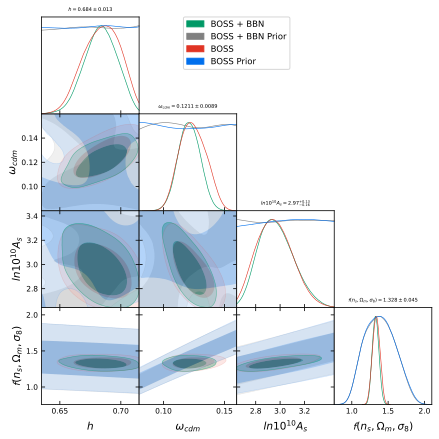

In [78]:
if plotting==False:
    g = plots.get_subplot_plotter(width_inch=7)
    g.settings.alpha_filled_add = 0.3
    g.settings.title_limit_fontsize = 0.8
    g.triangle_plot([posterior_copy, prior_copy, nobbn_posterior_copy, nobbn_prior_copy], 
                    params=params[:4], filled=True, 
                    title_limit=1,
                    param_limits=param_limits)

Non-log N_eff 	= 10.684



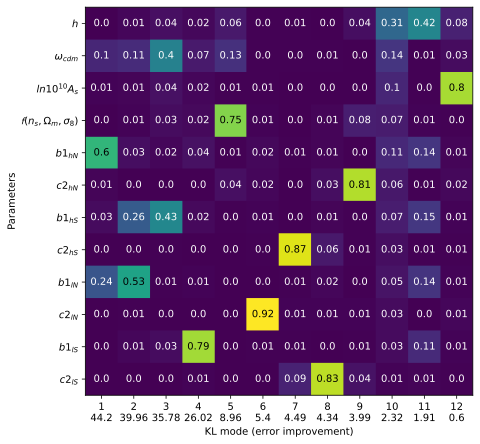

In [81]:
KL_eig, KL_eigv, KL_param_names = plot_frac_fisher(prior_chain=prior_copy, posterior_chain=posterior_copy, 
                                                   params=params, labels=labels, norm=True)

Non-log N_eff 	= 10.445



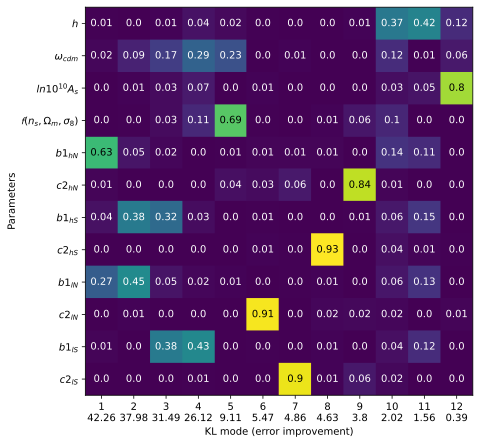

In [82]:
nobbn_KL_eig, nobbn_KL_eigv, nobbn_KL_param_names = plot_frac_fisher(prior_chain=nobbn_prior_copy, 
                                                    posterior_chain=nobbn_posterior_copy, 
                                                    params=params, labels=labels, norm=True)

We thus achieved exactly what we were looking for: **_a combination of cosmological parameters that preserves as much variance as possible at the level of the posterior, reducing the impact of the prior._**\
Two observations should be noted:
1. The newly defined parameter dominates over the mode number $5$ as the former were mostly informed by the $4$ sky-cuts of $b1$ - refer to the best CPC modes computed in the previous cells.
2. The 4 sky-cuts of $c2$ are now even more dominant than before on the modes subsequent to the fifth (related to $\mathcal{f}$), with percentage contributions in excess of $90\%$: this is a natural consequence of the elimination of the three parameters that are now collected in $\mathcal{f}$, which thus cannot balance the variance contribution on the modes dominated by $c2$.  This does not mean that $c2$ is more or less informed by the prior in absolute terms, but that, proportionally, it informs the parameters more significantly.

**Prior Shrinking**

In [90]:
# Building the KL-filtered sample array for BOSS + BBN
idx = [posterior_copy.index[name] for name in KL_param_names]
prior_mean = prior_copy.getMeans(pars=[prior_copy.index[name] for name in KL_param_names])
posterior_mean = posterior_copy.getMeans(pars=[posterior_copy.index[name] for name in KL_param_names])
inv_KL_eigv = np.linalg.inv(KL_eigv)
# Only keeping the first 10 modes
inv_KL_eigv[10:,:] = 0.
# Project the shifted posterior samples on the KL modes
KL_filtered_samples = np.dot(np.dot(posterior_copy.samples[:,idx]-prior_mean, KL_eigv), inv_KL_eigv)+prior_mean

# Building the KL-filtered sample array for BOSS
idx = [nobbn_posterior_copy.index[name] for name in nobbn_KL_param_names]
nobbn_prior_mean = nobbn_prior_copy.getMeans(pars=[nobbn_prior_copy.index[name] for name in nobbn_KL_param_names])
nobbn_posterior_mean = nobbn_posterior_copy.getMeans(pars=[nobbn_posterior_copy.index[name] for name in nobbn_KL_param_names])
nobbn_inv_KL_eigv = np.linalg.inv(nobbn_KL_eigv)
# Only keeping the first 10 modes
nobbn_inv_KL_eigv[10:,:] = 0.
# Project the shifted posterior samples on the KL modes
nobbn_KL_filtered_samples = np.dot(np.dot(nobbn_posterior_copy.samples[:,idx]-nobbn_prior_mean, nobbn_KL_eigv), 
                                   nobbn_inv_KL_eigv)+nobbn_prior_mean

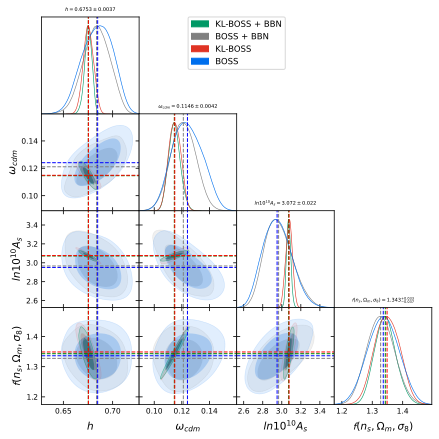

In [91]:
# Prior Shrinking - BOSS + BBN
KL_chain = MCSamples(samples=KL_filtered_samples, 
                     loglikes=posterior_copy.loglikes, 
                     weights=posterior_copy.weights, 
                     names=params, 
                     labels=[name.label for name in posterior_copy.getParamNames().parsWithNames(params)], 
                     label='KL-BOSS + BBN',
                     settings={'ignore_rows':0.})
# Prior Shrinking - BOSS
nobbn_KL_chain = MCSamples(samples=nobbn_KL_filtered_samples, 
                     loglikes=nobbn_posterior_copy.loglikes, 
                     weights=nobbn_posterior_copy.weights, 
                     names=params, 
                     labels=[name.label for name in nobbn_posterior_copy.getParamNames().parsWithNames(params)], 
                     label='KL-BOSS',
                     settings={'ignore_rows':0.})

g = plots.get_subplot_plotter(width_inch=7)
g.settings.alpha_filled_add = 0.3
g.settings.title_limit_fontsize = 0.8
# The titles refer to the mean values of the KL posterior distributions
# Cosmological Parameters
temp_params = params[:4]
g.triangle_plot([KL_chain, posterior_copy, nobbn_KL_chain, nobbn_posterior_copy], params=temp_params, filled=True, title_limit=1)
# Collecting mean values
KL_means = KL_chain.getMeans(pars=[KL_chain.index[name] for name in temp_params])
means = posterior_copy.getMeans(pars=[posterior_copy.index[name] for name in temp_params])
nobbn_KL_means = nobbn_KL_chain.getMeans(pars=[nobbn_KL_chain.index[name] for name in temp_params])
nobbn_means = nobbn_posterior_copy.getMeans(pars=[nobbn_posterior_copy.index[name] for name in temp_params])
# Display mean indicators
for i in range(len(temp_params)):
    # Fix the column, change the row -> decreasing from len(cosmo_params)
    for ax in g.subplots[i:,i]:
        ax.axvline(KL_means[i], color='green', lw=1., ls='--')
        ax.axvline(means[i], color='gray', lw=1., ls='--')
        ax.axvline(nobbn_KL_means[i], color='red', lw=1., ls='--')
        ax.axvline(nobbn_means[i], color='blue', lw=1., ls='--')
    # Fix the row, change the column -> increasing from 0
    for ax in g.subplots[i,:i]:
        ax.axhline(KL_means[i], color='green', lw=1., ls='--')
        ax.axhline(means[i], color='gray', lw=1., ls='--')
        ax.axhline(nobbn_KL_means[i], color='red', lw=1., ls='--')
        ax.axhline(nobbn_means[i], color='blue', lw=1., ls='--')

This procedure therefore allowed us not only to find a combination of parameters that preserves most of the variance $^1$, but also allowed us to define a new parameter that is practically unconstrained by a priori information, producing a consistent posterior distribution whether this information is included or not.

<font size=2>

$1$: We have already amply described the ways in which we can realise and verify this assertion, but it is worth noting, for further confirmation, how in the last plot the parameter $\mathcal{f}$ is marked by distributions that *(i)* on the 1D plane overlap very well, *(ii)* on the 2D planes are very sloping along the direction of $\mathcal{f}$, that is, the best-constrained direction among the ones we're dealing with. 